In [9]:
import matplotlib.pyplot as plt
from matplotlib import rc, rcParams
import numpy as np
import pandas as pd
import splusdata

In [10]:
fontsize = 35
labelsize = 35


rc("xtick", labelsize=fontsize)
rc("ytick", labelsize=fontsize)
rcParams["axes.linewidth"] = 5.3
rcParams["xtick.major.width"] = 5.3
rcParams["xtick.minor.width"] = 5.3
rcParams["ytick.major.width"] = 5.3
rcParams["ytick.minor.width"] = 5.3
rcParams["xtick.major.size"] = 12.5
rcParams["xtick.minor.size"] = 6.5
rcParams["ytick.major.size"] = 12.5
rcParams["ytick.minor.size"] = 6.5

font = {'family': 'serif',
        'color':  'black',
        'weight': 'normal',
        'size': 50,
        }


cmap = plt.get_cmap('gnuplot2')
color_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
colors = [cmap(value) for value in color_values]

In [2]:
conn = splusdata.connect('elosch', '@Hydra-Kentaurus1987')

You have access to internal data


In [4]:
hydra_table = pd.read_csv("tables_photometric/Hydra_iDR4_morecolumns.csv", usecols=['RA_1', 'DEC_1', 'zml', 'r_petro', 
                                                    'g_petro', 'odds', 'PROB_GAL', 'ID_1', 'SEX_FLAGS_DET'])

In [5]:
ra = hydra_table["RA_1"]
dec = hydra_table["DEC_1"]
zml = hydra_table["zml"]
rpetro = hydra_table["r_petro"]
gpetro = hydra_table["g_petro"]
odds = hydra_table["odds"]
prob_gal = hydra_table["PROB_GAL"]
ids = hydra_table["ID_1"]
flags = hydra_table["SEX_FLAGS_DET"]

In [6]:
#Defining the center of Hydra (in degress) --> from NED 
ra_0 = 159.17
dec_0 = -27.524

#radius of Hydra (R200)
radius = 1.5744

#calculating distances
def dist(ra, dec):
    return np.sqrt((ra - ra_0)**2 + (dec - dec_0)**2)

distance = dist(ra, dec)

In [7]:
mask_all = (zml > 0.0) & (zml < 0.03) & (distance < 5*radius) & (rpetro < 19) & (prob_gal 
                      > 0.8) & (odds > 0.7)

In [17]:
mask_already = (zml > 0.0) & (zml < 0.05) & (distance < 5*radius) & (prob_gal 
                                    > 0.5) & (odds > 0.5) & (flags == 0) & (rpetro < 17.9)
print(np.sum(mask_already))
print("Already done {:.2f}%".format((np.sum(mask_already)/np.sum(mask_all))*100))

558
Already done 92.23%


In [10]:
mask = (zml > 0.0) & (zml < 0.05) & (distance < 5*radius) & (prob_gal 
     > 0.7) & (odds > 0.5) & (rpetro > 10) & (rpetro < 13) & (flags < 3)
print(np.sum(mask))

108


/tmp/ipykernel_172326/3539454774.py:11: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout(h_pad=0.0, w_pad=-30.0)


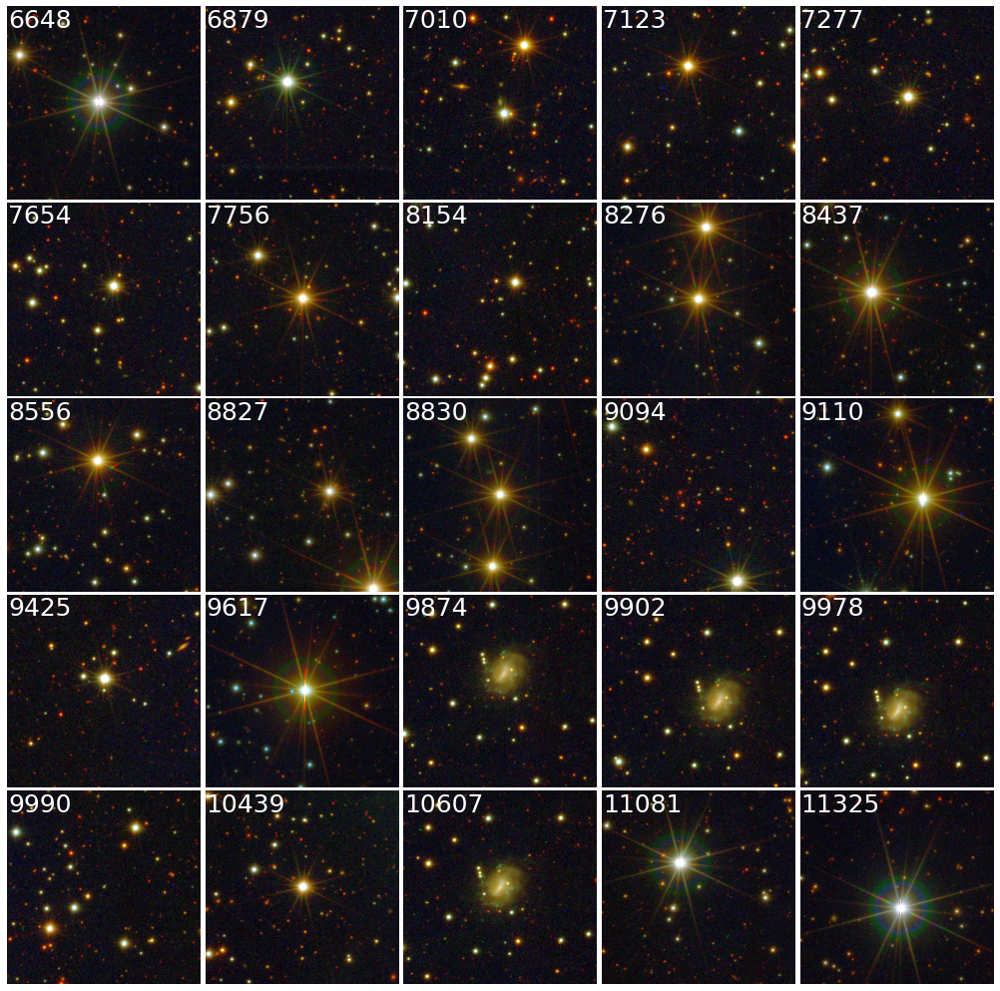

In [26]:
i = 2

fig, axs = plt.subplots(5, 5, figsize=(20, 14), constrained_layout = True)
for ax, index in zip(axs.ravel(), ra[mask_all][((i-1)*25):(i*25)].index):
    img = conn.twelve_band_img(ra[index], dec[index], radius=500, noise=0.15, saturation=0.15)
    ax.imshow(img)
    ax.axis('off')

    tx = ax.text(2, 35, str(index), color='white', verticalalignment='center', fontsize=25)
#     plt.savefig("../Figures/Hydra-visual-inspection/img(rpetro17.5-18)-probgal0.7{:2d}.png".format(i), format="png")
plt.tight_layout(h_pad=0.0, w_pad=-30.0)
plt.savefig("../Figures/Dissertation/visual-inspection.png", format="png")

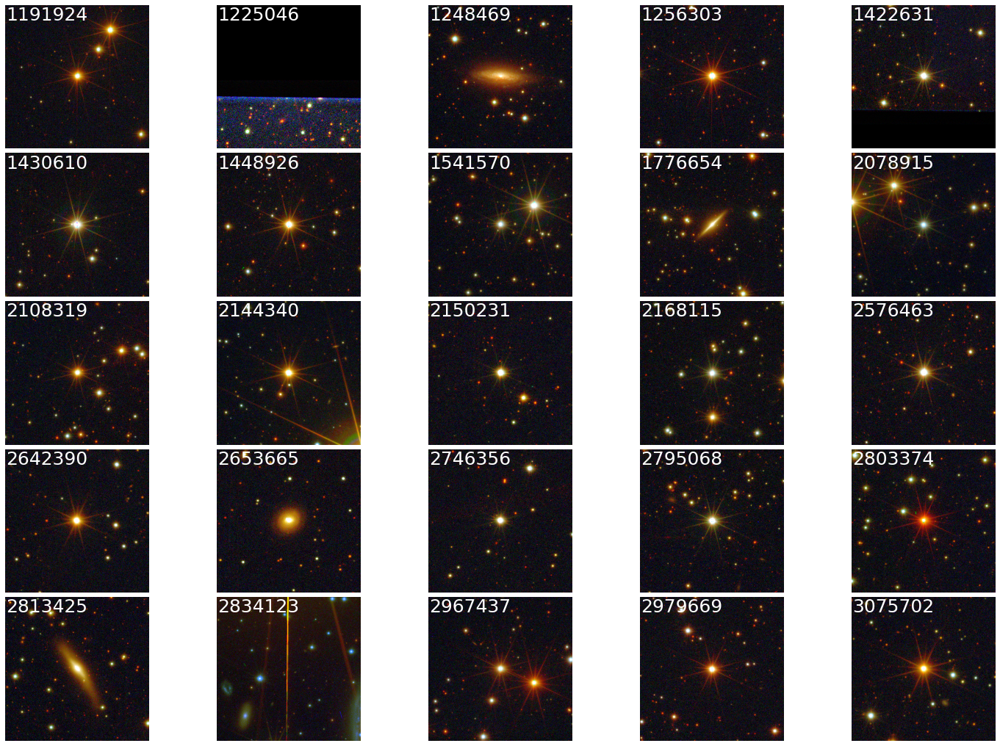

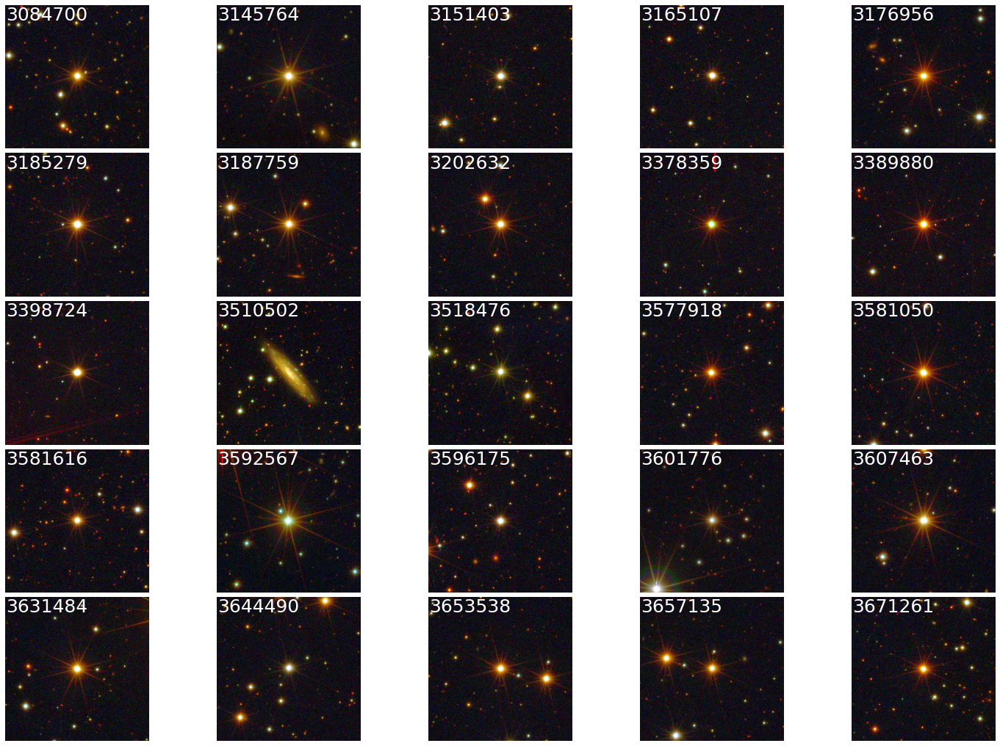

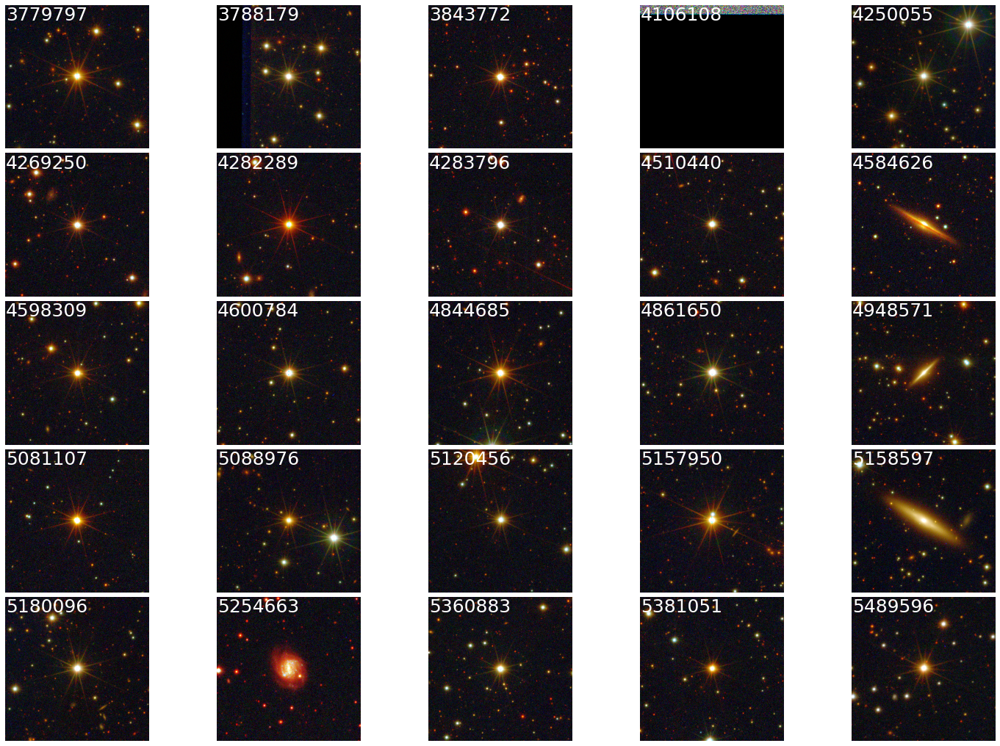

In [15]:
i = np.arange(2, 5, 1)
for i in i:
    fig, axs = plt.subplots(5, 5, figsize=(20, 14), constrained_layout = True)
    for ax, index in zip(axs.ravel(), ra[mask][((i-1)*25):(i*25)].index):
        img = conn.twelve_band_img(ra[index], dec[index], radius=500, noise=0.15, saturation=0.15)
        ax.imshow(img)
        ax.axis('off')
        
        tx = ax.text(2, 35, str(index), color='white', verticalalignment='center', fontsize=25)
#     plt.savefig("../Figures/Hydra-visual-inspection/img(rpetro17.5-18)-probgal0.7{:2d}.png".format(i), format="png")
    plt.savefig("../Figures/Hydra-visual-inspection/testing-flags{:2d}.png".format(i), format="png")

In [ ]:
i = 9

fig, axs = plt.subplots(5, 5, figsize=(20, 14), constrained_layout = True)
for ax, index in zip(axs.ravel(), ra[mask][((i-1)*25)+17:((i-1)*25)+26].index):
# for ax, index in zip(axs.ravel(), ra[mask][((i-1)*25):(i*25)].index):
    img = conn.twelve_band_img(ra[index], dec[index], radius=400, noise=0.15, saturation=0.15)
    ax.imshow(img)
    ax.axis('off')

    tx = ax.text(2, 25, str(index), color='white', verticalalignment='center', fontsize=25)
    
plt.savefig("../Figures/Hydra-visual-inspection/img(rpetro12-12.5){:2d}(2).png".format(i), format="png")

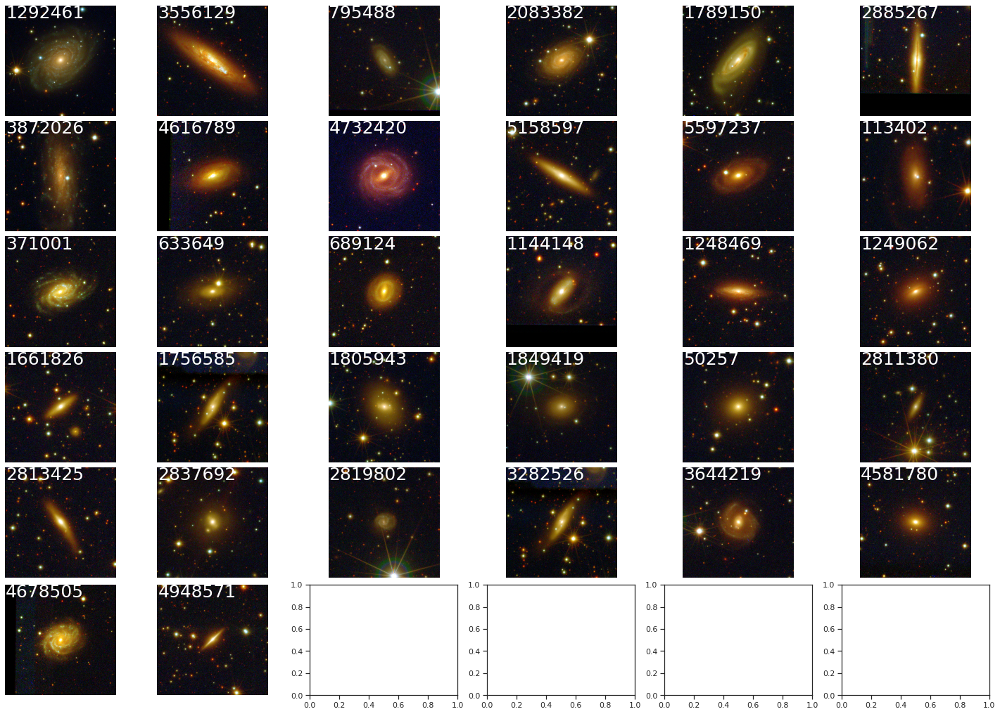

In [7]:
galaxies_upto13 = [1292461, 3556129, 795488, 2083382, 1789150, 2885267,
           3872026, 4616789, 4732420, 5158597, 5597237, 113402, 
           371001, 633649, 689124, 1144148, 1248469, 1249062, 
           1661826, 1756585, 1805943, 1849419, 50257, 
           2811380, 2813425, 2837692, 2819802, 3282526, 
           3644219, 4581780, 4678505, 4948571]

maybe_galaxies_upto13 = [229630, 2788815, 2792252, 2668106, 2997041, 2999032, 
                 2789879, 2794685, 2994066, 2994185]

galaxies_bet13and16 = []

galaxies_over16 = [1670, 34113, 30359, ]

maybe_galaxies_over16 = [7819, 18363, 18872, 18897, 21077, 28779]

duplicated = [384770, 5348856, 1776654, 2836542]


fig, axs = plt.subplots(6, 6, figsize=(20, 14), constrained_layout = True)
for ax, index in zip(axs.ravel(), galaxies_upto13):
    img = conn.twelve_band_img(ra[index], dec[index], radius=500, noise=0.15, saturation=0.15)
    ax.imshow(img)
    ax.axis('off')

    tx = ax.text(2, 35, str(index), color='white', verticalalignment='center', fontsize=25)

In [6]:
galaxies_upto13 = [1292461, 3556129, 795488, 2083382, 1789150, 2885267,
           3872026, 4616789, 4732420, 5158597, 5597237, 113402, 
           371001, 633649, 689124, 1144148, 1248469, 1249062, 
           1661826, 1756585, 1805943, 1849419, 50257, 
           2811380, 2813425, 2837692, 2819802, 3282526, 
           3644219, 4581780, 4678505, 4948571]

odds[galaxies_upto13], prob_gal[galaxies_upto13]

(1292461    0.999634
 3556129    0.995888
 795488     0.998077
 2083382    0.998807
 1789150    0.907009
 2885267    0.997286
 3872026    0.998055
 4616789    0.999572
 4732420    0.996558
 5158597    0.999064
 5597237    0.998448
 113402     0.996988
 371001     0.995706
 633649     0.999596
 689124     0.997948
 1144148    0.997837
 1248469    0.998313
 1249062    0.998431
 1661826    0.999199
 1756585    0.998450
 1805943    0.997770
 1849419    0.998125
 50257      0.995847
 2811380    0.999346
 2813425    0.982665
 2837692    0.997085
 2819802    0.996962
 3282526    0.998499
 3644219    0.970366
 4581780    0.999441
 4678505    0.996401
 4948571    0.877691
 Name: odds, dtype: float64,
 1292461    1.00
 3556129    1.00
 795488     1.00
 2083382    1.00
 1789150    1.00
 2885267    1.00
 3872026    1.00
 4616789    1.00
 4732420    1.00
 5158597    0.99
 5597237    1.00
 113402     0.98
 371001     1.00
 633649     1.00
 689124     0.99
 1144148    1.00
 1248469    1.00
 1249062  

In [11]:
print(np.array(ids[galaxies_upto13]))

['iDR4_3_HYDRA-0080_0016917' 'iDR4_3_HYDRA-0051_0046392'
 'iDR4_3_SPLUS-n18s11_0005169' 'iDR4_3_HYDRA-0071_0032896'
 'iDR4_3_HYDRA-D-0001_0049879' 'iDR4_3_HYDRA-0075_0049588'
 'iDR4_3_HYDRA-0050_0061079' 'iDR4_3_HYDRA-0044_0047366'
 'iDR4_3_SPLUS-n16s08_0002301' 'iDR4_3_HYDRA-0033_0044137'
 'iDR4_3_HYDRA-0036_0051736' 'iDR4_3_HYDRA-0072_0047996'
 'iDR4_3_SPLUS-n17s10_0044677' 'iDR4_3_HYDRA-0085_0055184'
 'iDR4_3_HYDRA-0064_0056439' 'iDR4_3_SPLUS-n17s04_0002573'
 'iDR4_3_HYDRA-0073_0035626' 'iDR4_3_HYDRA-0073_0036374'
 'iDR4_3_HYDRA-0083_0059368' 'iDR4_3_HYDRA-D-0001_0010332'
 'iDR4_3_HYDRA-D-0001_0070357' 'iDR4_3_HYDRA-0048_0015339'
 'iDR4_3_HYDRA-0016_0014146' 'iDR4_3_HYDRA-0045_0039429'
 'iDR4_3_HYDRA-0045_0041941' 'iDR4_3_HYDRA-0045_0071634'
 'iDR4_3_HYDRA-0045_0049794' 'iDR4_3_HYDRA-D-0003_0092076'
 'iDR4_3_HYDRA-0028_0034942' 'iDR4_3_HYDRA-0044_0005592'
 'iDR4_3_HYDRA-0046_0063658' 'iDR4_3_HYDRA-D-0002_0029847']


### Flags and PROB_GAL of visually selected galaxies

Text(0.5, 1.0, 'PROB_GAL (visually selected galaxies up to r_petro=13)')

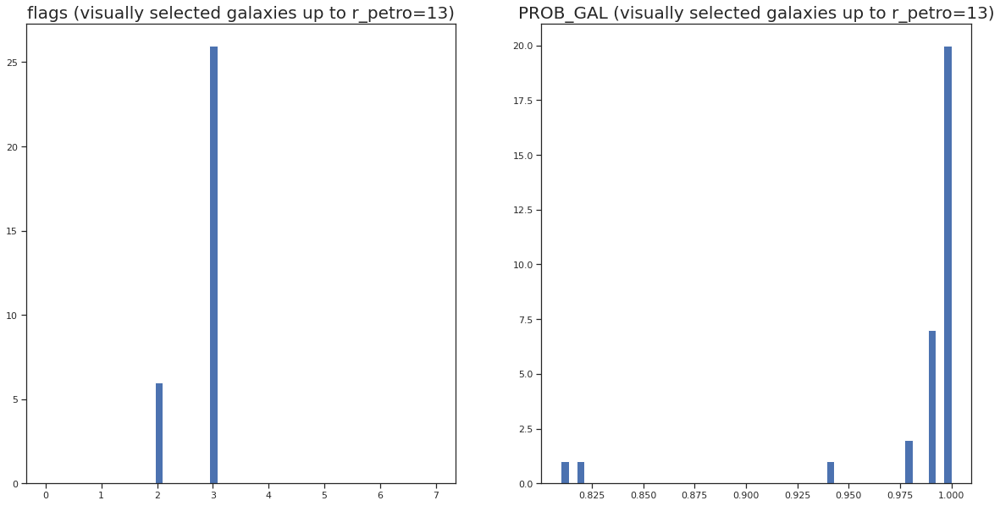

In [7]:
mask = (zml > 0.0) & (zml < 0.05) & (distance < 5*radius) & (rpetro < 13) & (prob_gal > 0.7)

indexes = ra[mask].index

galaxies_mask = np.isin(indexes, galaxies_upto13)
galaxies = indexes[galaxies_mask]
stars = indexes[~galaxies_mask]

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].hist(flags[galaxies], bins=50, range=[0, 7])
axs[0].set_title("flags (visually selected galaxies up to r_petro=13)", fontsize=20)

axs[1].hist(prob_gal[galaxies], bins=50)
axs[1].set_title("PROB_GAL (visually selected galaxies up to r_petro=13)", fontsize=20)

### Flags and PROB_GAL of visually selected stars (prob_gal > 0.7)

Text(0.5, 1.0, 'PROB_GAL (visually selected non-galaxies up to r_petro=13)')

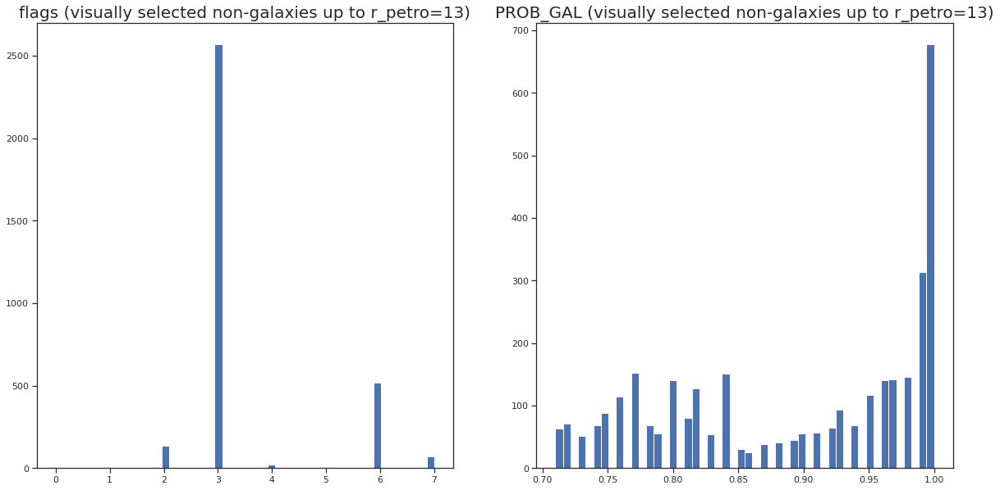

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].hist(flags[stars], bins=50, range=[0, 7])
axs[0].set_title("flags (visually selected non-galaxies up to r_petro=13)", fontsize=20)

axs[1].hist(prob_gal[stars], bins=50)
axs[1].set_title("PROB_GAL (visually selected non-galaxies up to r_petro=13)", fontsize=20)

In [9]:
print("Number of stars = ", np.sum(stars))
print("Number of galaxies = ", np.sum(galaxies))

Number of stars =  9459622463
Number of galaxies =  81369731


In [12]:
len(galaxies)

32

In [13]:
len(stars)

3342

### Creating a catalogue of stars and galaxies visually selected up to r_petro 13

In [27]:
hydra_table.loc[np.isin(ids, ids[galaxies])].to_csv("tables_saved/galaxies_upto13.csv", index=False)

In [26]:
hydra_table.loc[np.isin(ids, ids[stars])].to_csv("tables_saved/stars_upto13.csv", index=False)